# TFT Timeseries forecasting

# 1. EDA and Cleaning

We import featurewiz in order to create time-related features and pytorch_forecasting to define the Temporal fusion transformer (TFT) model and its hyperparameter tuning function.

In [3]:
!pip install --quiet featurewiz==0.0.42
!pip install --quiet pytorch_lightning
!pip install --quiet pytorch_forecasting
print('Installing TensorFlow Data Validation')
!pip install --upgrade 'tensorflow_data_validation[visualization]<2'

     |████████████████████████████████| 1.1 MB 16.0 MB/s 
     |████████████████████████████████| 173.6 MB 7.0 kB/s 
     |████████████████████████████████| 86 kB 4.9 MB/s 
     |████████████████████████████████| 596 kB 49.2 MB/s 
     |████████████████████████████████| 134 kB 8.8 MB/s 
     |████████████████████████████████| 829 kB 36.6 MB/s 
     |████████████████████████████████| 397 kB 42.7 MB/s 
     |████████████████████████████████| 952 kB 44.7 MB/s 
     |████████████████████████████████| 1.1 MB 42.4 MB/s 
     |████████████████████████████████| 271 kB 40.2 MB/s 
     |████████████████████████████████| 144 kB 60.5 MB/s 
     |████████████████████████████████| 94 kB 3.4 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
datascience 0.10.6 requires folium==0.2.

We import tensorflow data validation for the initial Exploratory data analysis of the train data

## 1.1 Imports

In [1]:
import os
import warnings
import pandas as pd
import featurewiz as FW
import numpy as np
import tensorflow as tf
import tensorboard as tb
import copy
from pathlib import Path
import warnings
import numpy as np
import torch
from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
import sys
import time
import gc
from tensorflow.keras import backend as K
from dateutil.relativedelta import relativedelta
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
import tensorflow_data_validation as tfdv
from preparation import preparation

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Imported featurewiz: advanced feature engg and selection library. Version=0.0.42
output = featurewiz(dataname, target, corr_limit=0.70,
                    verbose=2, sep=',', header=0, test_data='',
                    feature_engg='', category_encoders='')
Create new features via 'feature_engg' flag : ['interactions','groupby','target']
                                


## 1.2 Data download

We download the train, store and test data and define the datatype of the Date and StateHoliday column. 


In [4]:
train_data = pd.read_csv("data/train.csv")
store=pd.read_csv("data/store.csv")
test_data=pd.read_csv("data/test.csv")
train_data.Date=pd.to_datetime(train_data.Date)
train_data.StateHoliday=train_data.StateHoliday.astype(str)

C:\Users\user\AppData\Roaming\Python\Python38\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


## 1.3 Checking missing values and data types

We visualize the statistics and information for each column in the train and store dataframes using tensorflow data visualization. We create a Schema, which defines constraints for the data that are relevant for ML. With the schema we can find the data type of each column and the unique values for the categorical (STRING) columns. 

In [ ]:
train_stats =tfdv.generate_statistics_from_dataframe(train_data.merge(store, on="Store"))
schema = tfdv.infer_schema(statistics=train_stats)
tfdv.display_schema(schema=schema)

,Type,Presence,Valency,Domain
Feature name,,,,
'Store',INT,required,,-
'DayOfWeek',INT,required,,-
'Sales',INT,required,,-
'Customers',INT,required,,-
'Open',INT,required,,-
'Promo',INT,required,,-
'StateHoliday',STRING,required,,'StateHoliday'
'SchoolHoliday',INT,required,,-
'StoreType',STRING,required,,'StoreType'


,Values
Domain,
'StateHoliday',"'0', 'a', 'b', 'c'"
'StoreType',"'a', 'b', 'c', 'd'"
'Assortment',"'a', 'b', 'c'"
'PromoInterval',"'Feb,May,Aug,Nov', 'Jan,Apr,Jul,Oct', 'Mar,Jun,Sept,Dec'"


Then we plot the main statistics for each data, both for numeric and categorical features. The most important statistics we have to look at during cleaning is the percentage of missing values and zeros en each column. These are shown in the columns Missing and Zeros and they are in red if they are bigger than 5%. Tensorflow data validation plots an interactive visualization.

In [ ]:

tfdv.visualize_statistics(train_stats)

<p align="center">
  <img src="images/fig_1.PNG" width=800>
</p>

<p align="center">
  <img src="images/fig_2.PNG" width=800>
</p>

<p align="center">
  <img src="images/fig_3.PNG" width=800>
</p>

<p align="center">
  <img src="images/fig_4.PNG" width=800>
</p>

So we find that Promo2SinceYear, Promo2SinceWeek, CompetitionOpenSinceMonth, CompetitionOpenSinceYear and PromoInterval have more than 30% of missing values. CompetitionDistance has 0.26% of missing values. We finally display the anomalies in the test data in comparison to the train and store dataframes, so we can check wich columns are not in the test data and if there are problems in the existing features. 

In [ ]:
serving_stats = tfdv.generate_statistics_from_dataframe(test_data)
serving_anomalies = tfdv.validate_statistics(serving_stats, schema)

tfdv.display_anomalies(serving_anomalies)

,Anomaly short description,Anomaly long description
Feature name,,
'StoreType',Column dropped,Column is completely missing
'Customers',Column dropped,Column is completely missing
'Open',Multiple errors,"The feature has a shape, but it's not always present (if the feature is nested, then it should always be present at each nested level) or its value lengths vary. The feature was present in fewer examples than expected: minimum fraction = 1.000000, actual = 0.999732"
'CompetitionOpenSinceYear',Column dropped,Column is completely missing
'Sales',Column dropped,Column is completely missing
'Promo2',Column dropped,Column is completely missing
'Promo2SinceWeek',Column dropped,Column is completely missing
'CompetitionOpenSinceMonth',Column dropped,Column is completely missing
'Promo2SinceYear',Column dropped,Column is completely missing


There are missing values in the columns CompetitionOpenSinceYear, CompetitionOpenSinceMonth and CompetitionDistance. We will drop the first two columns and fill the missing values in the CompetitionDistance column. We merge the Train and Store dataframes.

In [3]:
train_data=train_data.merge(store[["Store", "CompetitionDistance", "StoreType", "Assortment"]], on="Store")

In [4]:
train_data.isnull().sum()

Store                     0
DayOfWeek                 0
Date                      0
Sales                     0
Customers                 0
Open                      0
Promo                     0
StateHoliday              0
SchoolHoliday             0
CompetitionDistance    2642
StoreType                 0
Assortment                0
dtype: int64

In [5]:
print("Stores with missing values in the CompetitionDistance column: ", train_data[train_data.CompetitionDistance.isnull()].Store.unique())

Stores with missing values in the CompetitionDistance column:  [291 622 879]


But there are just three stores with missing values: 291, 622 and 879. 

## 1.4 Filling missing values for Competition distance column

We fill the missing values with the median Competition distance of the other 1113 stores. 

In [6]:
print("Median competition distance: ",train_data.CompetitionDistance.median())
train_data.CompetitionDistance=train_data.CompetitionDistance.fillna(train_data.CompetitionDistance.median())

Median competition distance:  2330.0


Then we checked if the values were correctly filled for each store. 

In [7]:
print(train_data[train_data.Store==291].CompetitionDistance.unique(),
  train_data[train_data.Store==622].CompetitionDistance.unique(),
  train_data[train_data.Store==879].CompetitionDistance.unique())

[2330.] [2330.] [2330.]


## 1.5 Filling missing sales 

It is necessary to check if a store has more than one Sales record for each unique date and if each date has a sales value for each store, since by default pytorch forecasting timeseries datasets allow missing timesteps but fill them with 0. We use the pandas duplicated, group by and value_counts functions. 

In [8]:
print("Number of duplicated records: ",train_data.duplicated(["Date", "Store"]).sum())
print(train_data.groupby("Store").size().reset_index()[0].value_counts())

Number of duplicated records:  0
942    934
758    180
941      1
Name: 0, dtype: int64


In [9]:
print("Days recorded: ", (train_data.Date.max()-train_data.Date.min()).days+1)

Days recorded:  942


We find that from 1115 stores, 934 have sales registered for all the 942 days considered in the train data, while 180 Stores have just 758 sales recorded and 1 has 941 days. We filter the stores that have missing sales values.

In [10]:
train_data.Store.value_counts().reset_index()[train_data.Store.value_counts().reset_index().Store==758]

,index,Store
935,539,758
936,46,758
937,89,758
938,1107,758
939,1012,758
...,...,...
1110,159,758
1111,637,758
1112,636,758
1113,633,758


We can plot the historical sales for some of these stores

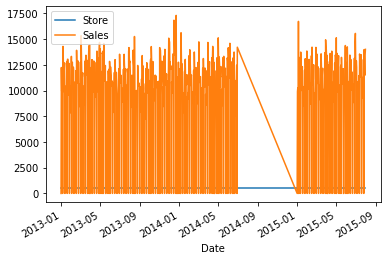

In [11]:
train_data[["Date", "Store", "Sales"]][train_data.Store==539].set_index("Date").plot()

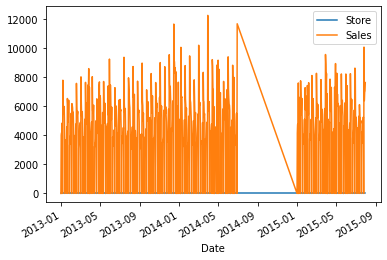

In [12]:
train_data[["Date", "Store", "Sales"]][train_data.Store==46].set_index("Date").plot()

According to the plots, for some reason there were no sales for these stores between July, 2014 and january 2015. We check if this is the case for all the stores with missing values.

In [13]:
train_data.Date.value_counts().reset_index().sort_values(by=["Date", "index"]).head(185)

,index,Date
825,2014-07-01,935
824,2014-07-02,935
823,2014-07-03,935
822,2014-07-04,935
821,2014-07-05,935
...,...,...
877,2014-12-28,935
876,2014-12-29,935
770,2014-12-30,935
758,2014-12-31,935


We reindex the dates from the start date to the end date recorded so that all stores have the same dates. 

In [14]:
print("Start date: ", train_data.Date.astype(str).min())
print("End date: ", train_data.Date.astype(str).max())

Start date:  2013-01-01
End date:  2015-07-31


In [15]:
date_index = pd.date_range(start=train_data.Date.astype(str).min(), end=train_data.Date.astype(str).max(), freq='D')

In [16]:
train_data=train_data.sort_values(by=["Store", "Date"])
train_data=preparation.reindexing(train_data,date_index)

Now we check which columns have missing values

In [17]:
train_data.isnull().sum()

index                      0
Store                      0
DayOfWeek              33121
Sales                  33121
Customers              33121
Open                   33121
Promo                  33121
StateHoliday           33121
SchoolHoliday          33121
CompetitionDistance        0
StoreType                  0
Assortment                 0
dtype: int64

We impute the empty sales data with the same values of the last year (July 2013-January 2014).  For the columns "CompetitionDistance", "StoreType" and "Assortment" we take the last values of each store, since these are static variables. First, it is necessary to create new columns with the last year sales using the shift function.

In [18]:
train_data=train_data.rename(columns={"index":"Date"})
train_data=train_data.sort_values(by=["Store", "Date"])
train_data=train_data.reset_index(drop=True)
train_data=preparation.add_last_year_values(train_data)
train_data.Sales=train_data.Sales.fillna(-1)

In [19]:
train_data.isnull().sum()

Date                            0
Store                           0
DayOfWeek                   33121
Sales                           0
Customers                   33121
Open                        33121
Promo                       33121
StateHoliday                33121
SchoolHoliday               33121
CompetitionDistance             0
StoreType                       0
Assortment                      0
previous_sales             412556
previous_day               412556
previous_customers         412556
previous_open              412556
previous_promo             412556
previous_state_holiday     412556
previous_school_holiday    412556
dtype: int64

Then we fill the missing values with the values of this past year values columns. 

In [20]:
train_data["DayOfWeek"]=train_data.apply(lambda row: row["previous_day"] if row["Sales"]==-1 else row["DayOfWeek"], axis=1)
train_data["Customers"]=train_data.apply(lambda row: row["previous_customers"] if row["Sales"]==-1 else row["Customers"], axis=1)
train_data["Open"]=train_data.apply(lambda row: row["previous_open"] if row["Sales"]==-1 else row["Open"], axis=1)
train_data["Promo"]=train_data.apply(lambda row: row["previous_promo"] if row["Sales"]==-1 else row["Promo"], axis=1)
train_data["StateHoliday"]=train_data.apply(lambda row: row["previous_state_holiday"] if row["Sales"]==-1 else row["StateHoliday"], axis=1)
train_data["SchoolHoliday"]=train_data.apply(lambda row: row["previous_school_holiday"] if row["Sales"]==-1 else row["SchoolHoliday"], axis=1)
train_data["Sales"]=train_data.apply(lambda row: row["previous_sales"] if row["Sales"]==-1 else row["Sales"], axis=1)

We plot the sales of three of these stores to check if the values were correctly filled. 

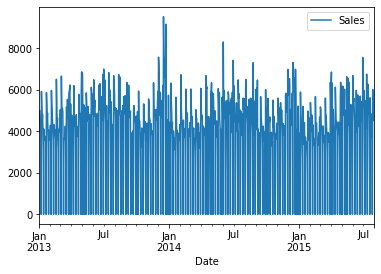

In [21]:
train_data[["Date", "Store", "Sales"]][train_data.Store==988].set_index("Date")[["Sales"]].plot()

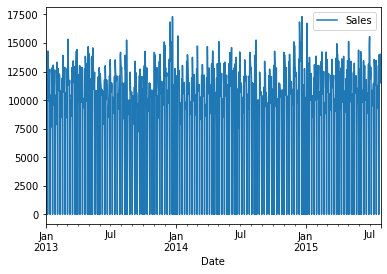

In [22]:
train_data[["Date", "Store", "Sales"]][train_data.Store==539].set_index("Date")[["Sales"]].plot()

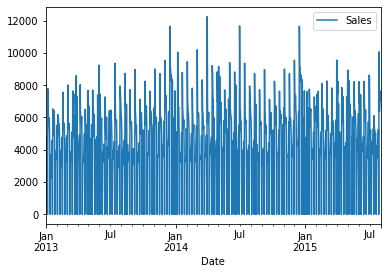

In [23]:
train_data[["Date", "Store", "Sales"]][train_data.Store==46].set_index("Date")[["Sales"]].plot()

Then we take only the necessary columns for training and check if there are still missing values. 

In [24]:
train_data=train_data[["Date", "Store","DayOfWeek", "Sales", "Customers", "Open", "Promo", "StateHoliday", "SchoolHoliday", "CompetitionDistance", "StoreType", "Assortment"]]

In [25]:
train_data.isnull().sum()

Date                   0
Store                  0
DayOfWeek              1
Sales                  1
Customers              1
Open                   1
Promo                  1
StateHoliday           1
SchoolHoliday          1
CompetitionDistance    0
StoreType              0
Assortment             0
dtype: int64

There is one missing register, so we use the ffill function to fill this row. 

In [26]:
train_data=train_data.ffill().bfill()

In [27]:
!rm -rf lightning_logs

# 2. Preprocessing

The next step after filling and cleaning the data is to normalize the target and to add new features that could help improving the accuracy of the predictions. 

# 2.1 Scaling

We first scale the sales between -1 a 1 with a min max scaler.

In [28]:
scalers, train_data=preparation.min_max_scaler(train_data)

# 2.2 Add time index

In [29]:
train_data.Date=pd.to_datetime(train_data.Date)
test_data.Date=pd.to_datetime(test_data.Date)

We add a time_idx column necessary for training with temporal fusion transformer. 

In [30]:
time_idx=pd.DataFrame(sorted(train_data.Date.unique())).append(pd.DataFrame(sorted(test_data.Date.unique())))
time_idx=time_idx.reset_index(drop=True).reset_index().sort_values(by=0)
time_idx.columns=["time_idx", "Date"]
train_data=train_data.merge(time_idx, on=["Date"])

# 2.3 Define test data

Check if all the stores have the same prediction length

In [31]:
print(len(test_data)/test_data.Store.nunique())
print(test_data.Date.nunique())

48.0
48


We merge the store columns with the test data and fill the missing values of the Open column using a dictionary for weekdays and weekends.  

In [32]:
test_data.Date=pd.to_datetime(test_data.Date)
test_data=test_data.merge(time_idx, on="Date").sort_values(by=["Store", "Date"])
test_data=test_data.assign(Sales=0)
store_data=train_data[["Store",'CompetitionDistance', 'StoreType', 'Assortment']].drop_duplicates("Store", keep="first")
test_data=test_data.merge(store_data, on=["Store"]).drop(columns="Id")

In [33]:
open_dict={1:1,2:1,3:1,4:1,5:1,6:1,7:0}
test_data.Open=test_data.Open.fillna(test_data.DayOfWeek.map(open_dict))

To predict with the new dates and stores given in the test data, we merge the train and the test dataframes and save it in a new one called Data.

In [34]:
data=pd.concat([train_data,test_data], axis=0)
data=data.fillna(0)

# 2.4 Add date features

We use the Featurewiz library to add data features like 'Date_quarter', 'Date_is_summer',
       'Date_is_winter', 'Date_dayofmonth' and 'Date_weekofyear'. There features could help the model recognize trends and seasonalities.

In [35]:
timestamp=data[["Date"]]
ts_column = 'Date'
data["Mes"]=pd.to_datetime(data[ts_column]).dt.month
data, ts_adds_in = FW.FE_create_time_series_features(data, ts_column, ts_adds_in=[])
data=data.drop(columns=[ 'Date_dayofweek',
       'Date_dayofweek_hour_cross', 'Date_month',
       'Date_is_festive','Date_is_cold',
       'Date_is_warm', 'Date_month_dayofweek_cross', 'Date_year',
       'Date_age_in_years', 'Date_dayofyear', 
        'Date_typeofday', 'Date_month_typeofday_cross'])
data["timestamp"]=timestamp

    created 19 columns from time series Date column
        dropped 2 time series added columns due to zero variance
        dropping Date column after time series done
    After dropping zero variance cols, shape of data: (1091418, 30)


# 3. Training

## 3.1 Set training parameters and timeseries dataset columns

We use a dictionary called params_dict to set the training parameters and then we split the data into test and train datasets. One of the main advantages of the temporal fusion transformer (TFT) implementation in pytorch_forecasting is that it allows to add categorical features encoding them by default with the scikit's learn LabelEncoder. To define the timeseries dataset class we have to specify which variables are numerical or categorical and known in the future (like date features or sales promotions) and which are numerical or categorical but unknown in the future (like the number of customers in the store). The test data given in kaggle shows the next 48 days as the prediction interval, so we define our forecast_horizon (decoder lenght) as 48 and the input_window, wich represents the lenght of the TFT encoder, as 96 days. This means that the model will a window of 96 days to predict the next 48 days. As a rule it is better to use an input window greater than the forecast horizon.

In [36]:
params_dict={"forecast_horizon":48,
             "input_window":96,
             "batch_size":16,
             "group_ids":["Store"],
             "unknown_reals":["Sales", "Customers"],
             "known_reals":["time_idx", 'Date_quarter','Date_dayofmonth', 'Date_weekofyear'] ,
              "static_reals":["CompetitionDistance"],
             "static_categoricals":["StoreType", "Assortment"],
             "known_categoricals":[ 'Date_is_summer', 'Date_is_winter',"Mes",'DayOfWeek',"Open", "Promo", "StateHoliday", "SchoolHoliday"],
             "target":"Sales",
             "unknown_categoricals":[],
             }
n_stores=data.Store.nunique()

In [37]:
test_data=data[data.time_idx> (data.time_idx.max()-params_dict["forecast_horizon"]-params_dict["input_window"])]
data=data[data.time_idx<= (data.time_idx.max()-params_dict["forecast_horizon"])]

We create the TimeSeriesDataSet used for training models in the pytorch forecasting library with the parameters defined in the parameters dictionary and modify the DataType of some numerical columns and convert them to string to use them as categorical features.

In [38]:
for feature in params_dict["known_categoricals"]:
  data[feature]=data[feature].astype(str)
  test_data[feature]=test_data[feature].astype(str)


If it already exists, the lightning_logs folder where the training logs, models and images are going to be saved is deleted before training the model.

In [39]:
!rm -rf lightning_logs

In the main training function, we create the training and validation dataloaders in the pytorch forecasting format and make some baseline predictions. The training_cutoff is the time index where the dataset is goint to be split into training and validation sets. In this case, we take the last 48 days as validation dataset and leave the rest days for training.  

## 3.2 Create training and validation sets

In [40]:
    tf.io.gfile = tb.compat.tensorflow_stub.io.gfile
    predict={}
    file_writer = tf.summary.create_file_writer("lightning_logs/img")
    training_cutoff = data["time_idx"].max() -params_dict["forecast_horizon"]
    training=preparation.create_training_dataset(data, params_dict["target"], training_cutoff,params_dict["group_ids"], params_dict["input_window"], params_dict["forecast_horizon"], params_dict["unknown_reals"], params_dict["known_reals"],params_dict["static_reals"], params_dict["unknown_categoricals"],  params_dict["known_categoricals"],  params_dict["static_categoricals"])
    validation = TimeSeriesDataSet.from_dataset(training, data[data.time_idx <= (data["time_idx"].max())], predict=True, stop_randomization=True) 
    # create dataloaders for model
    train_dataloader = training.to_dataloader(train=True, batch_size=params_dict["batch_size"] , num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=2*params_dict["batch_size"], num_workers=0)
    print("Training cutoff: ", training_cutoff)
  

Training cutoff:  893


## 3.3 Estimate baseline error

We use the baseline model of pytorch forecasting that uses last known target value to make predictions and calculate baseline performance in terms of mean absolute error (MAE)

In [41]:
    actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
    baseline_predictions = Baseline().predict(val_dataloader)
    print("Baseline error: ",(actuals - baseline_predictions).abs().mean().item())
    print("Baseline error median: ",(actuals - baseline_predictions).abs().median().item())

Baseline error:  0.3329482078552246
Baseline error median:  0.24794165790081024


## 3.4 Hyperparameter tuning

We tune the temporal fusion transformer using 50 epochs and 15 trials. 

In [42]:
# create study
study = optimize_hyperparameters(
        train_dataloader,
        val_dataloader,
        model_path="lightning_logs",
        log_dir="lightning_logs",
        n_trials=15,
        max_epochs=50,
        gradient_clip_val_range=(0.01, 1),
        hidden_size_range=(16, 128),
        hidden_continuous_size_range=(8, 64),
        attention_head_size_range=(1, 4),
        learning_rate_range=(0.001, 0.1),
        dropout_range=(0.1, 0.4),
        trainer_kwargs=dict(limit_train_batches=100),
        reduce_on_plateau_patience=20,
        use_learning_rate_finder=False,  # use Optuna to find ideal learning rate or use in-built learning rate finder
        verbose=1
    )

[I 2022-03-13 17:42:45,700] A new study created in memory with name: no-name-69f66550-08dd-4168-95d2-30bd5e479f0f
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
[I 2022-03-13 18:42:37,294] Trial 0 finished with value: 0.01915501058101654 and parameters: {'gradient_clip_val': 0.45918352638997406, 'hidden_size': 97, 'dropout': 0.3756072028420884, 'hidden_continuous_size': 39, 'attention_head_size': 4, 'learning_rate': 0.009285653152934134}. Best is trial 0 with value: 0.01915501058101654.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
[I 2022-03-13 19:09:44,094] Trial 1 finished with value: 0.020164059475064278 and parameters: {'gradient_clip_val': 0.016327746677527184, 'hidden_size': 21, 'dropout': 0.16588210296915895, 'hidden_continuous_size': 10, 'attention_head_size': 3, 'learning_rate': 0.0018731864330573816}. Best is trial 0 with value: 0.01915501058101654

This hyperparameter tuning takes 3 hours or even more for the number of epochs and trials defined.

## 3.5 Predict on validation data and estimate validation  MAE error

We load the best model trained using the load_from_checkpoint function  at the epoch where the validaion loss was the lowest and we use the predict function in raw mode to get not only the predictions but also the attention given to the time indexes in the validation dataset and the real values for each store sales in this dataset. Besides, we plot the predictions of the validation set vs the real sales for each score and save these plots in the logs folder so we can check the results for each store in tensorboard. 

In [43]:
best_model_path="lightning_logs/trial_"+str(study.best_trial.number)+"/"+os.listdir("lightning_logs/trial_"+str(study.best_trial.number))[0]
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)     
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions,x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
with file_writer.as_default():
  for idx, item in enumerate(data.Store.unique()):
    tf.summary.image("Prediction_"+str(item), preparation.plot_to_image(best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True)), step=0)
aux=pd.DataFrame(raw_predictions["prediction"].numpy().reshape(n_stores*params_dict["forecast_horizon"] , 7))         


Calculate mean absolute error and median absolute error on validation set. To check the best model training, validation loss for different metrics and model hyperparameters, we open tensorboard in the path where the logs were saved (lightning_logs) and print the best trial parameters

In [44]:
print("Error mean: ",(actuals -aux[3].values.reshape(n_stores,params_dict["forecast_horizon"])).abs().mean() )
print("Error median: ",(actuals -aux[3].values.reshape(n_stores,params_dict["forecast_horizon"])).abs().median() )


Error mean:  tensor(0.0690)
Error median:  tensor(0.0477)


## 3.6 Plot training, validation loss and validation predictions

In [47]:
# show best hyperparameters
print(study.best_trial.params)

{'gradient_clip_val': 0.0258124807707133, 'hidden_size': 28, 'dropout': 0.195158464599251, 'hidden_continuous_size': 25, 'attention_head_size': 2, 'learning_rate': 0.009460460399271117}


There are the parameters used for the best models predicted, highlighted in red: 

<p align="center">
  <img src="images/fig_7.jpg" width=800>
</p>

With tensorboard we can plot the validation and train loss metrics vs each epoch for all the models trained and the parameters of each model.

In [48]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs

<IPython.core.display.Javascript object>

We can also plot the validation predictions directly in the notebook with the function plot_prediction. 

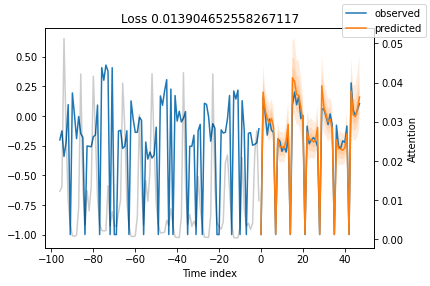

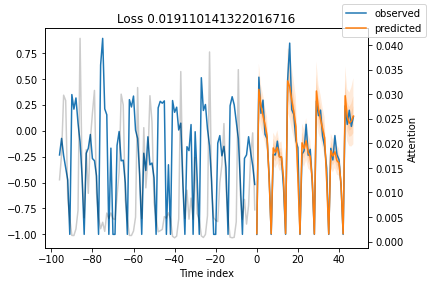

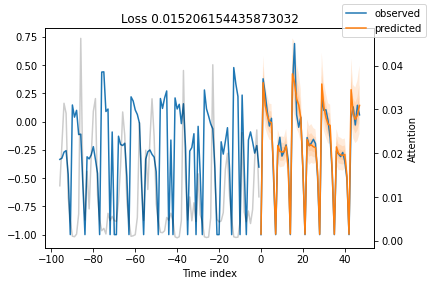

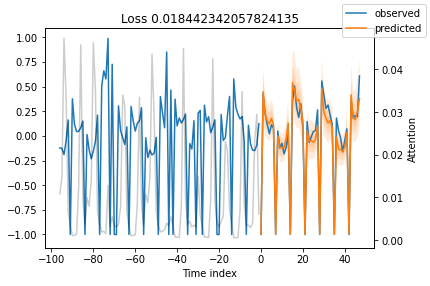

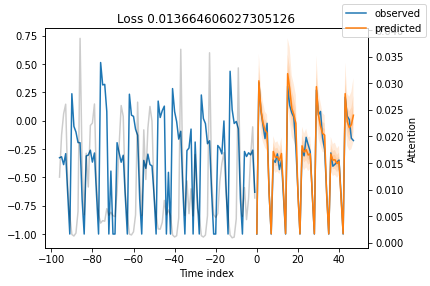

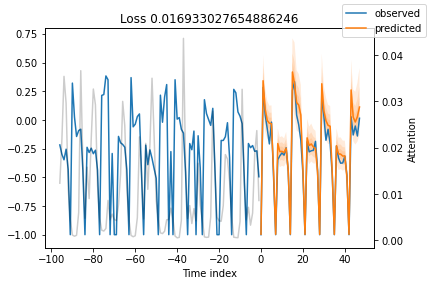

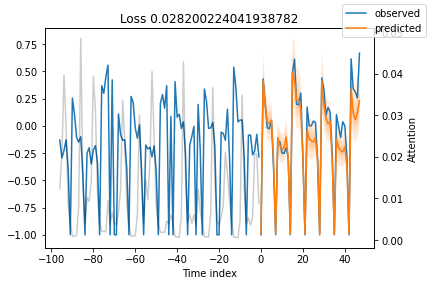

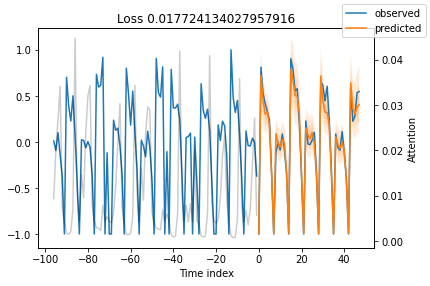

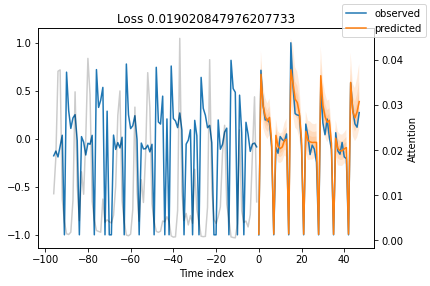

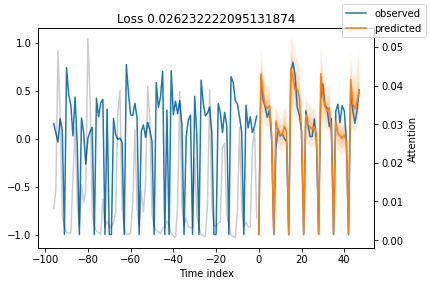

In [64]:
for idx in range(0,10):  # plot 10 first stores predictions examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

The temporal fusion transformer model has a Variable selection network and with the pytorch forecasting functions we can plot the importance of each Categorical and real feature both for the encoder and decoder. 

{'attention': <Figure size 432x288 with 1 Axes>,
 'static_variables': <Figure size 504x252 with 1 Axes>,
 'encoder_variables': <Figure size 504x414 with 1 Axes>,
 'decoder_variables': <Figure size 504x378 with 1 Axes>}

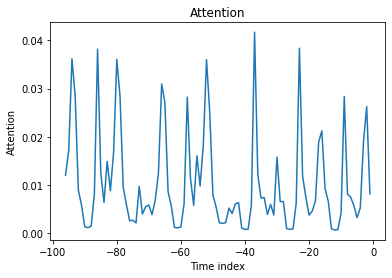

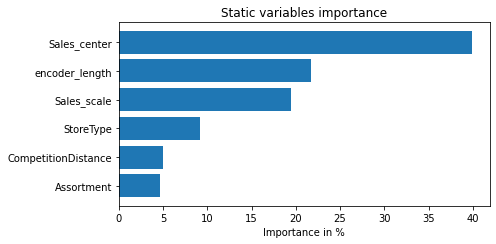

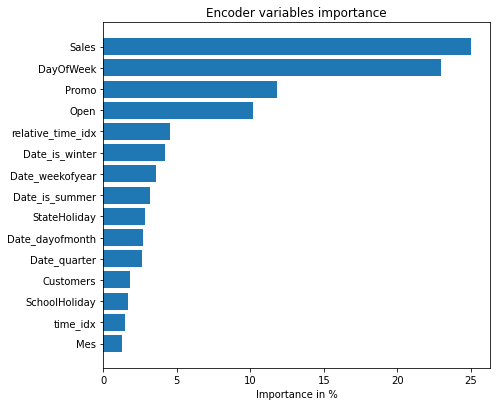

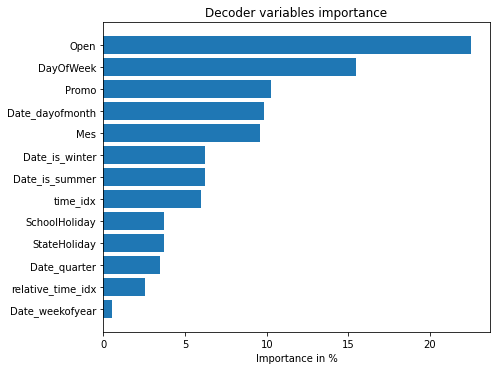

In [50]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)

From the first plot, which shows the attention given to each time index in the encoder, we can see which days were the most important in the sales history in general for all the stores. Regarding the encoder features, the most important is the sales columns, followed by the DayOfWeek, promotions and Open, which indicates if the store was open. In the decoder, the most important variables the Open flag, DayOfWeek and Promo columns. This was expected, since it is clear that when the store is closed there are no sales and that these sales depend a lot on the day of the week and promotions.

## 3.7 Predict on test data

Then we take the same model and predict the sales for the next 48 days and stores defined in the test_data, save them in a dataframe called predict and add the Store and time_idx columns. 

In [51]:
raw_test_predictions, x_test=best_tft.predict(test_data, mode="raw", return_x=True)
predict=pd.DataFrame(raw_test_predictions["prediction"].numpy().reshape(n_stores*params_dict["forecast_horizon"] , 7)) 
predict.columns=["p5","p20","p40","p50","p60","p80","p95"]
predict.insert(7, "Store", np.repeat(data.Store.unique(), params_dict["forecast_horizon"]))
predict.insert(8, "time_idx", np.tile(np.arange(data.time_idx.max()+1,data.time_idx.max()+1+params_dict["forecast_horizon"]), n_stores))

We could plot some of the predictions of the test data as we did with the validation data

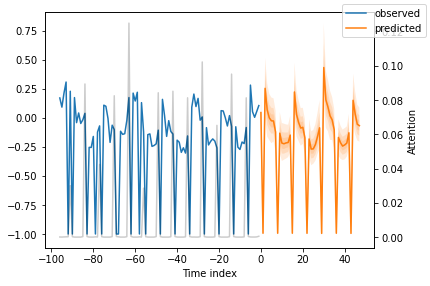

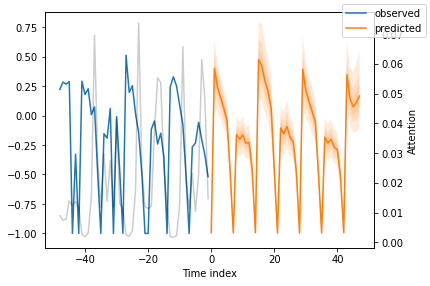

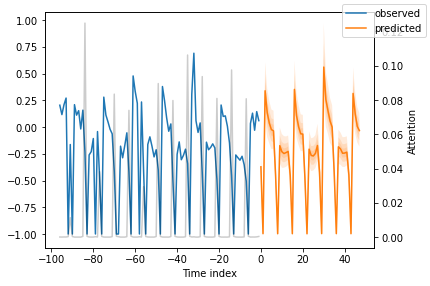

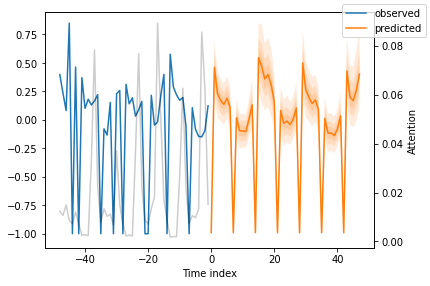

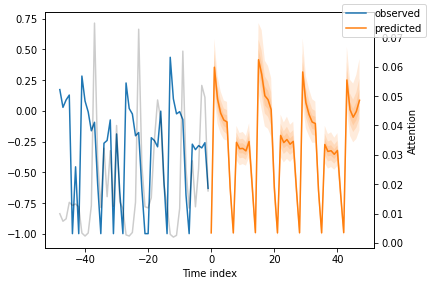

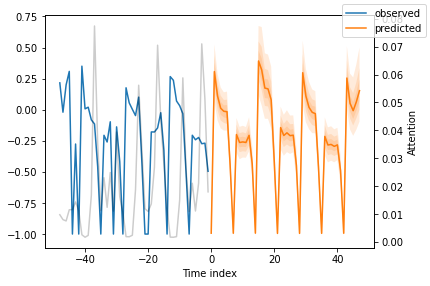

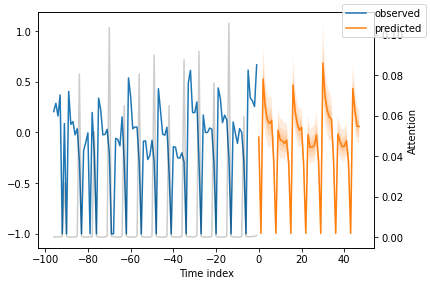

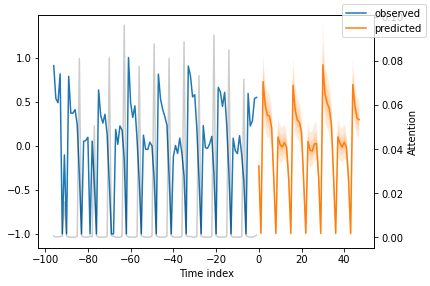

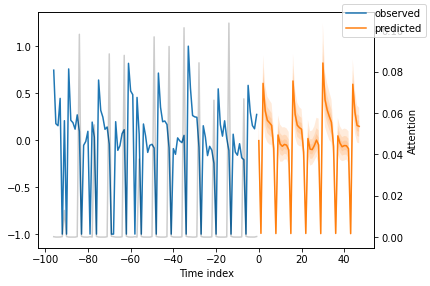

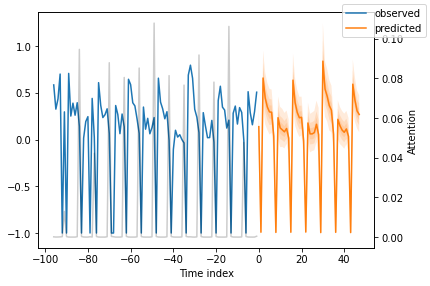

In [65]:
#Plot first 10 stores predictions
for idx in range(0,10): 
    best_tft.plot_prediction(x_test, raw_test_predictions, idx=idx, show_future_observed=False);

As we can see in the plots, the predictions are also scaled between -1 and 1, so we have to rescale them before the submission in Kaggle. 

In [53]:
predict.Store=predict.Store.astype(str)
predict=preparation.rescale(scalers,predict)
stamps=test_data[["timestamp","time_idx"]].drop_duplicates("time_idx")
predict=predict.merge(stamps, on="time_idx")

We check now for the first store if the sales values are in the original train data scale. 

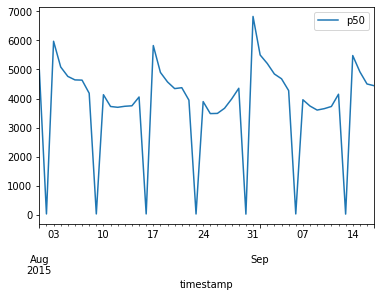

In [54]:
predict[predict.Store == "1.0"].set_index("timestamp")[["p50"]].plot()

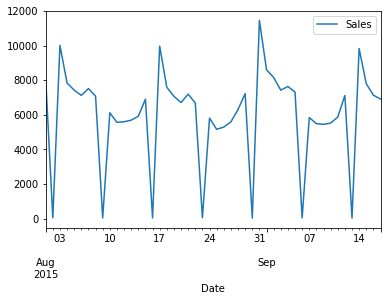

In [63]:
predict[predict.Store == 1115].set_index("Date")[["Sales"]].plot()

The last step is to clean and format the prediction DataFrame to the sample_submission format given in Kaggle. To do that, we take only the positive predictions and set to zero the ones that are negatives. 

In [55]:
predict.to_csv("p.csv")
predict=pd.read_csv("p.csv")
predict.timestamp=pd.to_datetime(predict.timestamp)
predict.Store=predict.Store.astype(int)
predict=predict.rename(columns={"p50":"Sales", "timestamp":"Date"})
predict.Sales=predict.apply(lambda row: row["Sales"] if row["Sales"]>=0 else 0,axis=1)

We merge the predict dataframe with the test data Id and make the submission.

In [56]:

test=pd.read_csv("data/test.csv")
test.Date=pd.to_datetime(test.Date)
test.Store=test.Store.astype(int)

submission=test.merge(predict[["Sales", "Store", "Date"]], on=["Date", "Store"])[["Id", "Store", "Sales"]]
submission.Sales=round(submission.Sales)
submission.Sales=submission.Sales.astype(int)
submission=submission.drop(columns=["Store"])

In [57]:
submission.to_csv("submission.csv", index=False)

# 4. Future Improvements

With the preparation of the data and the training of the model, an accuracy of 0.10573 was achieved in the public test dataset, while the accuracy of the lead team is 0.08932. So this is a very good result and it can be further improved. The process that I explained is only one of the possible ways to prepare and train the dataset, and I explain it and teach it only for academic reasons.There are a few options we can try to improve accuracy:

*   Take all the given columns in the Store dataset.
*   Fill in the missing sales values ​​in some stores not with the values ​​of the previous year but with the values ​​of previous months or using strategies such as Moving Average.
*   Normalize the data using a different strategy.
*   Add other external variables that can affect sales.
*   Do hyperparameter tuning with more epochs or more attempts.

